# Importing Libraries and Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import community
from community import community_louvain
import random
from tqdm.notebook import tqdm, trange
from collections import Counter

# Loading the Dataset

In [2]:
df_raw = pd.read_csv('data/desserts/pinoy_desserts.csv', usecols=['Dessert', 'Ingredients']).dropna()

df_raw

,Dessert,Ingredients
0,Cassava Cake,cassava
1,Cassava Cake,coconut cream
2,Cassava Cake,evaporated milk
3,Cassava Cake,eggs
4,Cassava Cake,butter
...,...,...
225,Crema de Fruta,gelatin
226,Crema de Fruta,fresh milk
227,Crema de Fruta,butter
228,Crema de Fruta,vanilla extract


# Exploratory Network Analysis

In [3]:
df = df_raw.copy()

In [4]:
df['Dessert'].unique()

array(['Cassava Cake', 'Bibingka', 'Banana Bread', 'Biko', 'Leche Flan',
       'Yema', 'Buko Pandan', 'Taho', 'Turon', 'Maja Blanca',
       'Puto Bumbong', 'Saging con Hielo', 'Ube Halaya', 'Sapin Sapin',
       'Buko Pie', 'Carioca', 'Ginataang Mais', 'Pastillas de Leche',
       'Espasol', 'Kutsinta', 'Kamotecue', 'Chocolate Crinkle',
       'Cathedral Window', 'Nilupak', 'Buko Ice Candy', 'Bananacue',
       'Suman sa Lihiya', 'Lengue de Gato', 'Polvoron', 'Pichi-Pichi',
       'Macaroni Salad', 'Fruit Salad', 'Buko Salad', 'Peanut Brittle',
       'Minatamis na Saging', 'Egg Pie', 'Buchi', 'Crema de Fruta'],
      dtype=object)

In [5]:
df['Dessert'].nunique()

38

In [6]:
df['Ingredients'].unique()

array(['cassava', 'coconut cream', 'evaporated milk', 'eggs', 'butter',
       'quick-melt cheese', 'condensed milk', 'white sugar', 'rice flour',
       'salt', 'baking powder', 'sugar', 'coconut milk', 'fresh milk',
       'salted duck egg', 'cheese', 'coconut', 'banana leaf', 'banana',
       'all purpose flour', 'cooking oil', 'vanilla extract',
       'baking soda', 'glutinous rice', 'water', 'brown sugar', 'peanuts',
       'all purpose cream', 'gelatin', 'sago', 'tofu', 'jackfruit',
       'lumpia wrapper', 'cornstarch', 'sweet corn', 'purple rice', 'ice',
       'purple yam', 'ube extract', 'vegetable shortening',
       'coconut water', 'powdered milk', 'lye', 'anatto seeds',
       'sweet potato', 'chocolate chips', 'cocoa powder',
       'powdered sugar', 'whipped cream', 'pineapple juice', 'pinipig',
       'buko pandan essence', 'macaroni', 'mayonnaise', 'nata de coco',
       'kaong', 'fruit cocktail', 'table cream', 'cherries', 'pineapple',
       'corn syrup', 'red bean

In [7]:
df['Ingredients'].nunique()

63

## Bipartite Projection

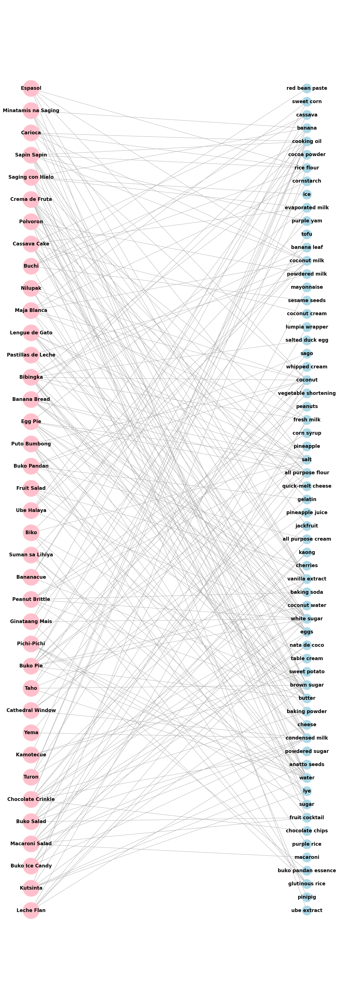

In [8]:
# Create a bipartite graph
B = nx.Graph()

# Add nodes with the 'Dessert' and 'Ingredients' as their attribute
for _, row in df.iterrows():
    dessert = row['Dessert']
    ingredient = row['Ingredients']
    B.add_node(dessert, bipartite=0)
    B.add_node(ingredient, bipartite=1)

# Add edges between dessert and ingredients
for _, row in df.iterrows():
    dessert = row['Dessert']
    ingredient = row['Ingredients']
    B.add_edge(dessert, ingredient)

# Separate nodes into two sets based on bipartite attribute
dessert_nodes = {n for n, d in B.nodes(data=True) if d['bipartite'] == 0}
ingredient_nodes = {n for n, d in B.nodes(data=True) if d['bipartite'] == 1}

# Create a figure and axes
fig, ax = plt.subplots(figsize=(20, 60))

# Draw bipartite network with vertical layout and different node colors
pos = nx.bipartite_layout(B, dessert_nodes, align='vertical')
nx.draw(B, pos, with_labels=True, node_color=['pink' if n in dessert_nodes else 'lightblue' for n in B.nodes()],
        font_size=16, node_size=[3000 if n in dessert_nodes else 1000 for n in B.nodes()], font_weight='bold', edge_color='darkgray', ax=ax)

# Set plot title
# ax.set_title('Bipartite Network of Dessert and Ingredients')

# Display the bipartite network
plt.show()

## Individual Projections

### Desserts

In [9]:
# Create dessert projection with edge weights based on initial edge count
dessert_projection = nx.bipartite.weighted_projected_graph(B, nodes=dessert_nodes, ratio=False)

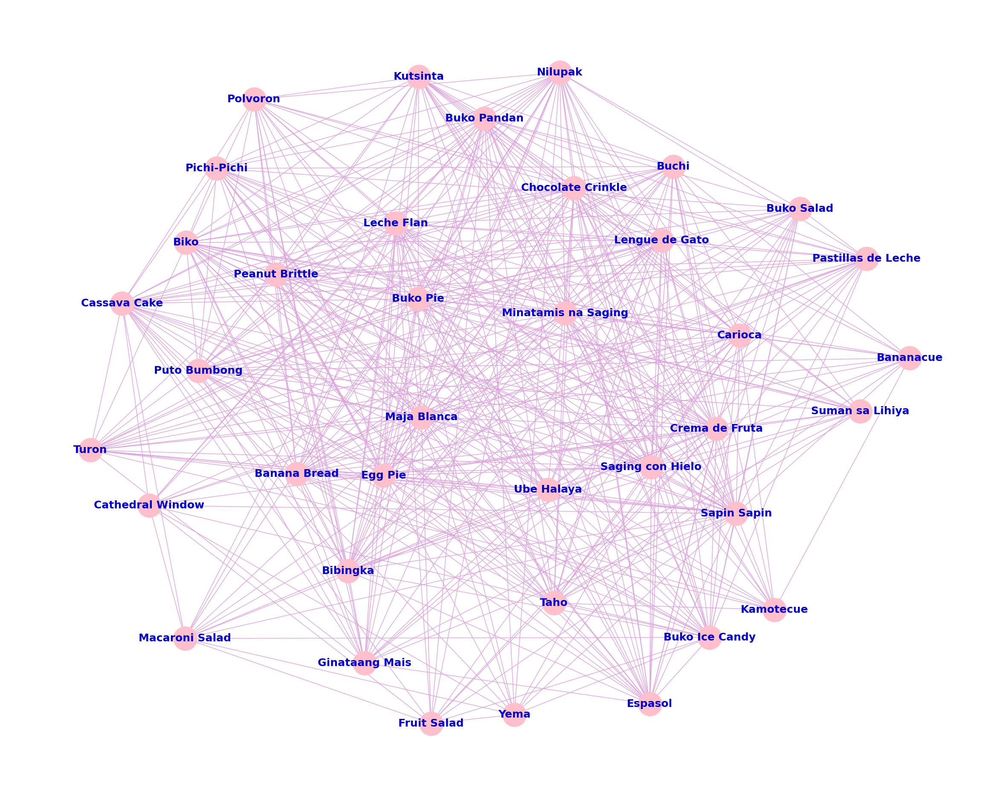

In [10]:
# Create a figure and axes for dessert projection
fig, ax = plt.subplots(figsize=(30, 24))
pos_dessert = nx.spring_layout(dessert_projection, k=3.5, weight='weight', seed=69)
nx.draw(dessert_projection, pos=pos_dessert, with_labels=True, node_color='pink', node_size=1600, font_weight='bold', font_color='mediumblue', font_size=18, edge_color='plum', ax=ax)
# ax.set_title('Dessert Projection', fontsize=24)
plt.show()

### Ingredients

In [11]:
# Create ingredient projection with edge weights based on initial edge count
ingredient_projection = nx.bipartite.weighted_projected_graph(B, nodes=ingredient_nodes, ratio=False)

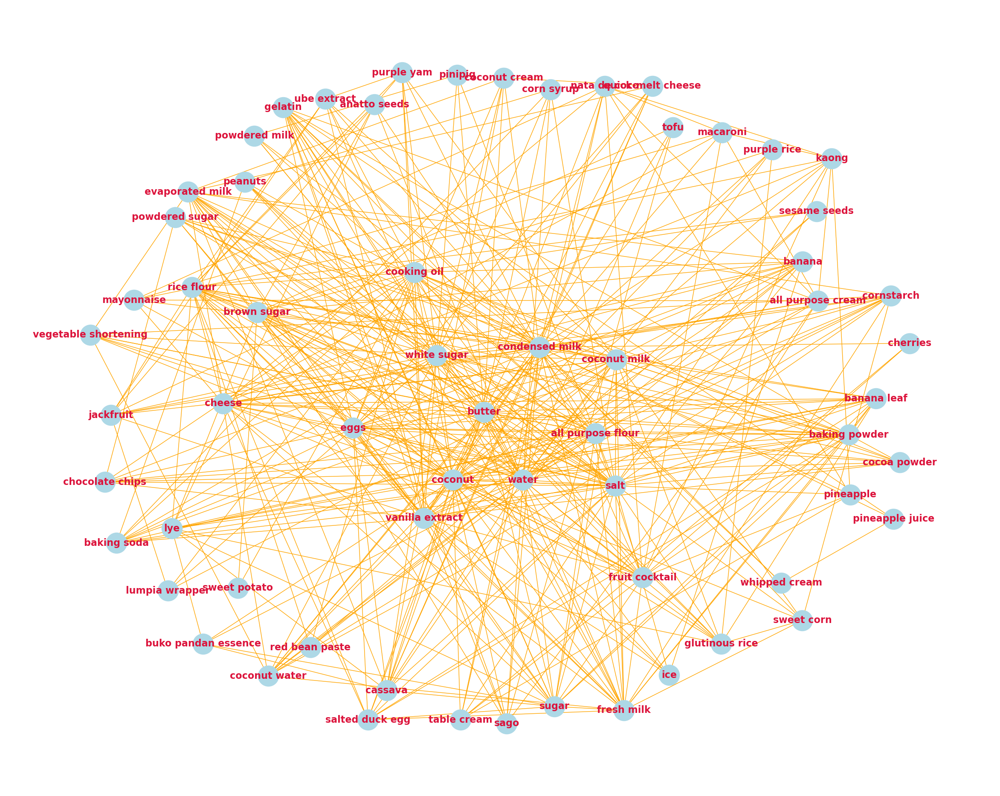

In [12]:
# Create a figure and axes for ingredient projection
fig, ax = plt.subplots(figsize=(30, 24))
pos_ingredient = nx.spring_layout(ingredient_projection, k=2.6, weight='weight', seed=69)
nx.draw(ingredient_projection, pos=pos_ingredient, with_labels=True, node_color='lightblue', node_size=1200, font_weight='bold', font_color='crimson', font_size=16, edge_color='orange', ax=ax)
# ax.set_title('Ingredient Projection', fontsize=24)
plt.show()

## Degree Distribution

### Desserts

In [13]:
# Calculate degrees for dessert projection and sort in descending order
dessert_degrees = dict(sorted(dessert_projection.degree(weight='weight'), key=lambda x: x[1], reverse=True))
dessert_degrees_df = pd.DataFrame.from_dict(dessert_degrees, orient='index', columns=['Degree_Dessert'])
dessert_degrees_df

,Degree_Dessert
Egg Pie,74
Buko Pie,68
Banana Bread,62
Crema de Fruta,61
Chocolate Crinkle,59
Bibingka,59
Sapin Sapin,59
Lengue de Gato,58
Maja Blanca,49
Saging con Hielo,49


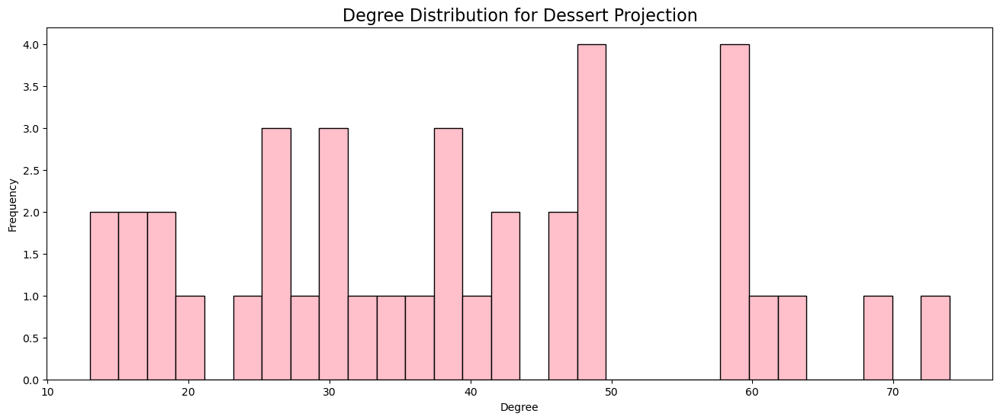

In [14]:
# Create a histogram
plt.figure(figsize=(16, 6))
plt.hist(dessert_degrees_df.values.flatten(), bins=30, color='pink', edgecolor='black')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution for Dessert Projection', fontsize=16)
plt.show()

### Ingredients

In [33]:
# Calculate degrees for ingredient projection and sort in descending order
ingredient_degrees = dict(sorted(ingredient_projection.degree(weight='weight'), key=lambda x: x[1], reverse=True))
ingredient_degrees_df = pd.DataFrame.from_dict(ingredient_degrees, orient='index', columns=['Degree_Ingredient'])
ingredient_degrees_df.head(10)

,Degree_Ingredient
white sugar,84
water,76
salt,72
vanilla extract,71
butter,67
coconut,63
condensed milk,60
eggs,59
all purpose flour,55
coconut milk,43


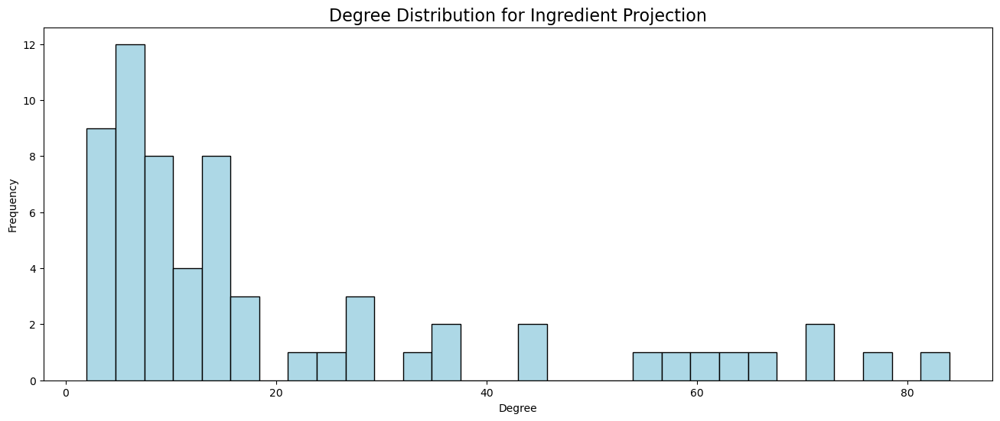

In [16]:
# Create a histogram
plt.figure(figsize=(16, 6))
plt.hist(ingredient_degrees_df.values.flatten(), bins=30, color='lightblue', edgecolor='black')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution for Ingredient Projection', fontsize=16)
plt.show()

## Clustering Coefficients

### Desserts

In [17]:
# Calculate clustering coefficients for dessert projection
dessert_clustering = nx.clustering(dessert_projection)

# Convert clustering coefficients to a DataFrame
dessert_clustering_df = pd.DataFrame.from_dict(dessert_clustering, orient='index', columns=['Clustering Coefficient'])

# Sort the DataFrame based on the clustering coefficient in descending order
dessert_clustering_df = dessert_clustering_df.sort_values(by='Clustering Coefficient', ascending=False)

# Display the clustering coefficient DataFrame for dessert projection
print("\nClustering Coefficients for Dessert Projection:\n")
display(dessert_clustering_df.tail(10))


Clustering Coefficients for Dessert Projection:



,Clustering Coefficient
Buko Ice Candy,0.713846
Carioca,0.713768
Nilupak,0.703704
Crema de Fruta,0.699507
Cassava Cake,0.692308
Leche Flan,0.690476
Puto Bumbong,0.686154
Buko Pandan,0.679894
Maja Blanca,0.679803
Sapin Sapin,0.625668


### Ingredients

In [53]:
# Calculate clustering coefficients for ingredient projection
ingredient_clustering = nx.clustering(ingredient_projection)

# Convert clustering coefficients to a DataFrame
ingredient_clustering_df = pd.DataFrame.from_dict(ingredient_clustering, orient='index', columns=['Clustering Coefficient'])

# Sort the DataFrame based on the clustering coefficient in descending order
ingredient_clustering_df = ingredient_clustering_df.sort_values(by='Clustering Coefficient', ascending=False)

# Display the clustering coefficient DataFrame for ingredient projection
print("\nLowest Clustering Coefficients for Ingredient Projection:\n")
display(ingredient_clustering_df.tail(5)[::-1])


Lowest Clustering Coefficients for Ingredient Projection:



,Clustering Coefficient
condensed milk,0.283784
water,0.339972
white sugar,0.354622
coconut,0.384127
butter,0.410985


In [54]:
display(ingredient_clustering_df.head(5))

,Clustering Coefficient
ube extract,1.0
pineapple juice,1.0
sesame seeds,1.0
tofu,1.0
cherries,1.0


## Centrality Measures

### Desserts

In [20]:
# Calculate centrality measures for dessert projection
dessert_degree_centrality = nx.degree_centrality(dessert_projection)
dessert_betweenness_centrality = nx.betweenness_centrality(dessert_projection, weight='weight')
dessert_closeness_centrality = nx.closeness_centrality(dessert_projection)
dessert_eigenvector_centrality = nx.eigenvector_centrality(dessert_projection, weight='weight')

# Create DataFrames for centrality measures of dessert projections
dessert_centrality_df = pd.DataFrame({
    'Dessert Degree Centrality': pd.Series(dessert_degree_centrality),
    'Dessert Betweenness Centrality': pd.Series(dessert_betweenness_centrality),
    'Dessert Closeness Centrality': pd.Series(dessert_closeness_centrality),
    'Dessert Eigenvector Centrality': pd.Series(dessert_eigenvector_centrality),
    
})

# Sort dessert names alphabetically
dessert_centrality_df = dessert_centrality_df.sort_index()

In [21]:
print("\nDessert Centrality DataFrame:\n")
display(dessert_centrality_df)


Dessert Centrality DataFrame:



,Dessert Degree Centrality,Dessert Betweenness Centrality,Dessert Closeness Centrality,Dessert Eigenvector Centrality
Banana Bread,0.756757,0.010071,0.804348,0.257990
Bananacue,0.378378,0.003424,0.616667,0.064395
Bibingka,0.783784,0.012577,0.822222,0.231482
Biko,0.702703,0.016530,0.770833,0.147552
Buchi,0.621622,0.037589,0.725490,0.090284
Buko Ice Candy,0.702703,0.029282,0.770833,0.135833
Buko Pandan,0.756757,0.029344,0.804348,0.119842
Buko Pie,0.837838,0.008516,0.860465,0.272377
Buko Salad,0.513514,0.017283,0.672727,0.074624
Carioca,0.648649,0.011716,0.740000,0.119475


### Ingredients

In [22]:
# Calculate centrality measures for ingredient projection
ingredient_degree_centrality = nx.degree_centrality(ingredient_projection)
ingredient_betweenness_centrality = nx.betweenness_centrality(ingredient_projection, weight='weight')
ingredient_closeness_centrality = nx.closeness_centrality(ingredient_projection)
ingredient_eigenvector_centrality = nx.eigenvector_centrality(ingredient_projection, weight='weight')

# Create DataFrames for centrality measures of ingredient projections
ingredient_centrality_df = pd.DataFrame({
    'Ingredient Degree Centrality': pd.Series(ingredient_degree_centrality),
    'Ingredient Betweenness Centrality': pd.Series(ingredient_betweenness_centrality),
    'Ingredient Closeness Centrality': pd.Series(ingredient_closeness_centrality),
    'Ingredient Eigenvector Centrality': pd.Series(ingredient_eigenvector_centrality),
    
})

# Sort ingredient names alphabetically
ingredient_centrality_df = ingredient_centrality_df.sort_index()

In [23]:
print("\nIngredient Centrality DataFrame:\n")
display(ingredient_centrality_df)


Ingredient Centrality DataFrame:



,Ingredient Degree Centrality,Ingredient Betweenness Centrality,Ingredient Closeness Centrality,Ingredient Eigenvector Centrality
all purpose cream,0.177419,0.011258,0.521008,0.026291
all purpose flour,0.451613,0.062585,0.645833,0.269097
anatto seeds,0.080645,0.001113,0.469697,0.020260
baking powder,0.338710,0.019091,0.601942,0.126785
baking soda,0.177419,0.010451,0.508197,0.072024
...,...,...,...,...
vanilla extract,0.483871,0.029216,0.659574,0.323174
vegetable shortening,0.145161,0.004017,0.512397,0.046489
water,0.612903,0.096208,0.720930,0.290291
whipped cream,0.048387,0.000132,0.433566,0.005777


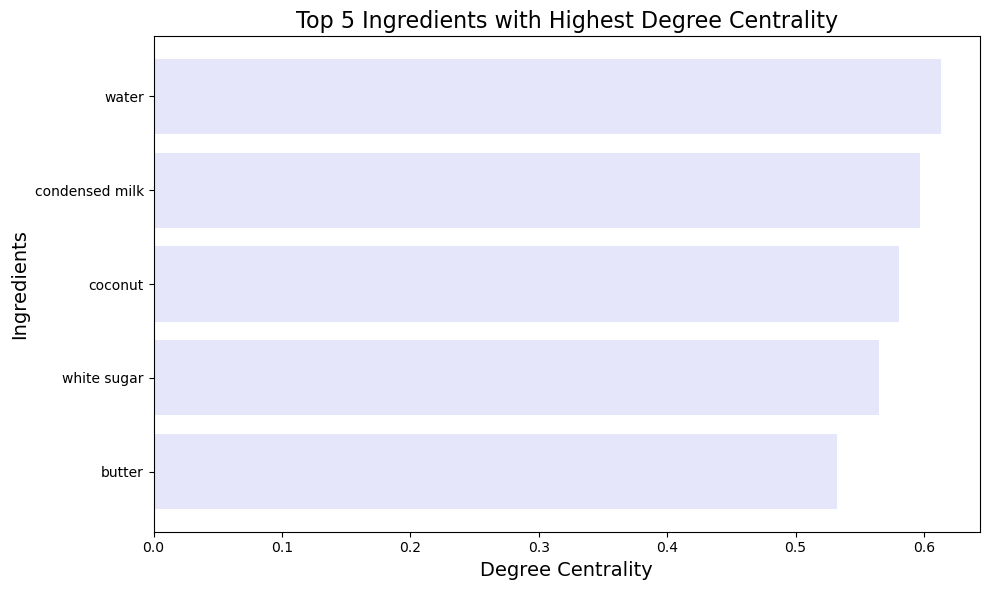

In [38]:
# Sort the DataFrame by 'Ingredient degree Centrality' in descending order
ingredient_degree_centrality_df_sorted = ingredient_centrality_df.sort_values(by='Ingredient Degree Centrality', ascending=False)

# Select the top 5 ingredients with the highest degree centrality
top_5_degree_ingredients = ingredient_degree_centrality_df_sorted.head(5)

# Reverse the order of the DataFrame to display the highest value at the top
top_5_degree_ingredients = top_5_degree_ingredients.iloc[::-1]

# Create a horizontal bar plot for the top 5 ingredients
plt.figure(figsize=(10, 6))
plt.barh(top_5_degree_ingredients.index, top_5_degree_ingredients['Ingredient Degree Centrality'], color='lavender')
plt.xlabel('Degree Centrality', fontsize=14)
plt.ylabel('Ingredients', fontsize=14)
plt.title('Top 5 Ingredients with Highest Degree Centrality', fontsize=16)
plt.tight_layout()
plt.show()

In [46]:
ingredient_centrality_df.sort_values('Ingredient Degree Centrality')

,Ingredient Degree Centrality,Ingredient Betweenness Centrality,Ingredient Closeness Centrality,Ingredient Eigenvector Centrality
sweet potato,0.032258,0.000824,0.410596,0.007292
whipped cream,0.048387,0.000132,0.433566,0.005777
cherries,0.048387,0.002225,0.433566,0.006074
pineapple juice,0.048387,0.000132,0.433566,0.005777
sesame seeds,0.064516,0.000254,0.462687,0.013860
...,...,...,...,...
butter,0.532258,0.058660,0.681319,0.298764
white sugar,0.564516,0.037444,0.696629,0.346002
coconut,0.580645,0.102243,0.704545,0.224056
condensed milk,0.596774,0.148796,0.712644,0.183030


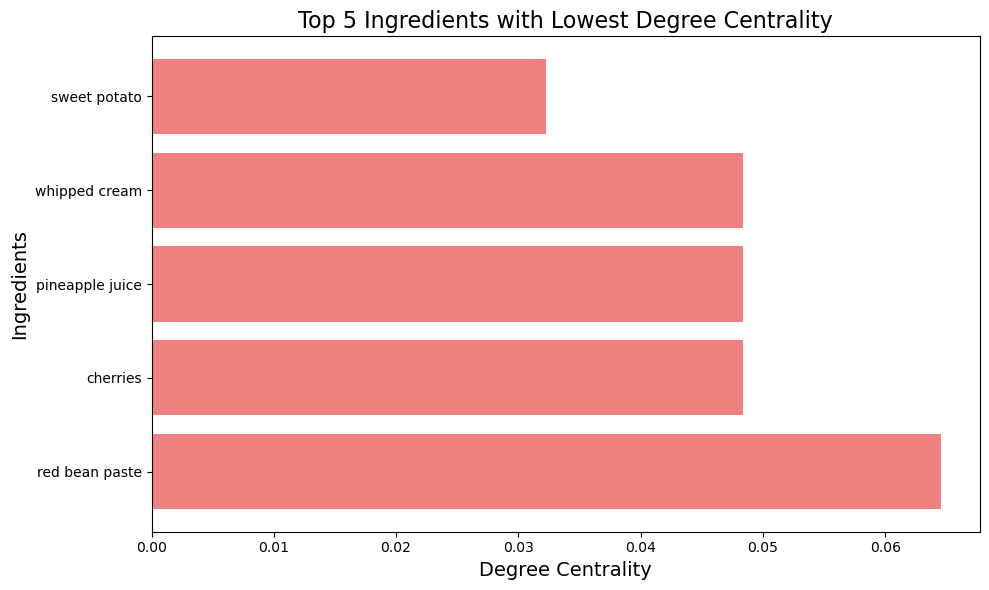

In [47]:
# Sort the DataFrame by 'Ingredient degree Centrality' in descending order
ingredient_degree_centrality_df_sorted = ingredient_centrality_df.sort_values(by='Ingredient Degree Centrality', ascending=False)

# Select the top 5 ingredients with the highest degree centrality
bottom_5_degree_ingredients = ingredient_degree_centrality_df_sorted.tail(5)

# Reverse the order of the DataFrame to display the highest value at the top
# bottom_5_degree_ingredients = bottom_5_degree_ingredients.iloc[::-1]

# Create a horizontal bar plot for the top 5 ingredients
plt.figure(figsize=(10, 6))
plt.barh(bottom_5_degree_ingredients.index, bottom_5_degree_ingredients['Ingredient Degree Centrality'], color='lightcoral')
plt.xlabel('Degree Centrality', fontsize=14)
plt.ylabel('Ingredients', fontsize=14)
plt.title('Top 5 Ingredients with Lowest Degree Centrality', fontsize=16)
plt.tight_layout()
plt.show()

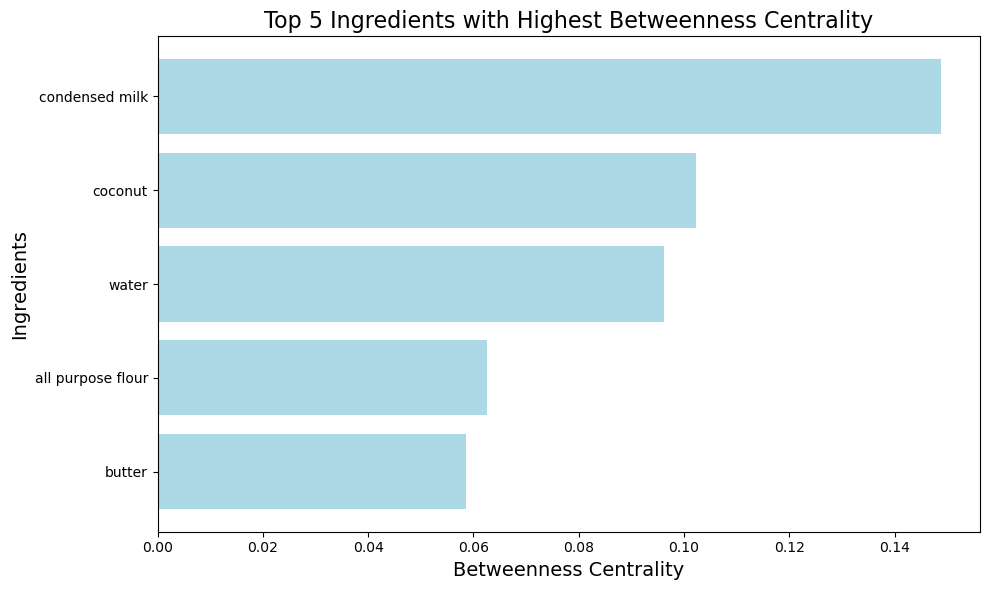

In [37]:
# Sort the DataFrame by 'Ingredient Betweenness Centrality' in descending order
ingredient_betweenness_centrality_df_sorted = ingredient_centrality_df.sort_values(by='Ingredient Betweenness Centrality', ascending=False)

# Select the top 5 ingredients with the highest betweenness centrality
top_5_betweenness_ingredients = ingredient_betweenness_centrality_df_sorted.head(5)

# Reverse the order of the DataFrame to display the highest value at the top
top_5_betweenness_ingredients = top_5_betweenness_ingredients.iloc[::-1]

# Create a horizontal bar plot for the top 5 ingredients
plt.figure(figsize=(10, 6))
plt.barh(top_5_betweenness_ingredients.index, top_5_betweenness_ingredients['Ingredient Betweenness Centrality'], color='lightblue')
plt.xlabel('Betweenness Centrality', fontsize=14)
plt.ylabel('Ingredients', fontsize=14)
plt.title('Top 5 Ingredients with Highest Betweenness Centrality', fontsize=16)
plt.tight_layout()
plt.show()

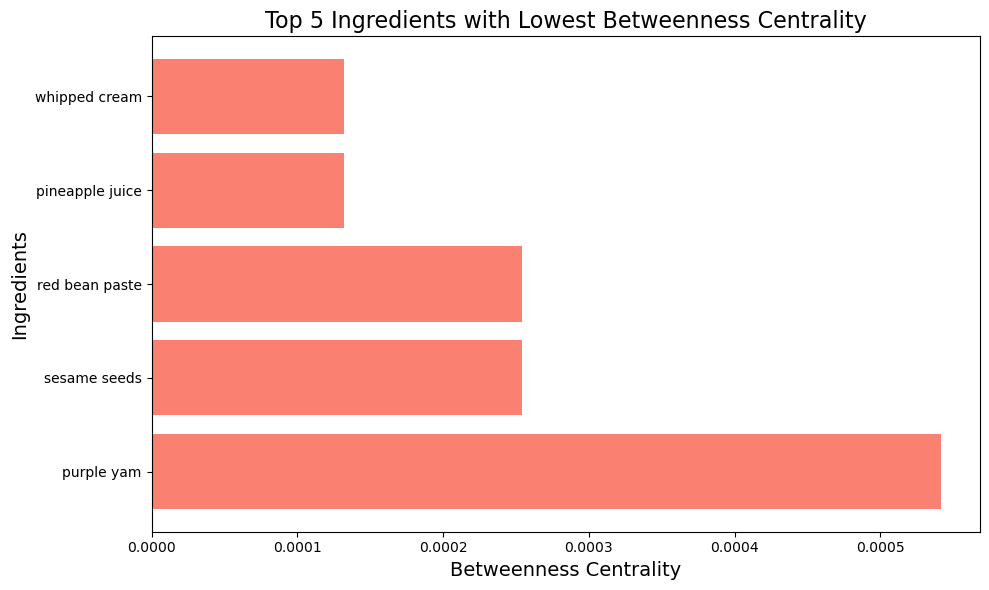

In [48]:
# Sort the DataFrame by 'Ingredient betweenness Centrality' in descending order
ingredient_betweenness_centrality_df_sorted = ingredient_centrality_df.sort_values(by='Ingredient Betweenness Centrality', ascending=False)

# Select the top 5 ingredients with the highest betweenness centrality
bottom_5_betweenness_ingredients = ingredient_betweenness_centrality_df_sorted.tail(5)

# Reverse the order of the DataFrame to display the highest value at the top
# bottom_5_betweenness_ingredients = bottom_5_betweenness_ingredients.iloc[::-1]

# Create a horizontal bar plot for the top 5 ingredients
plt.figure(figsize=(10, 6))
plt.barh(bottom_5_betweenness_ingredients.index, bottom_5_betweenness_ingredients['Ingredient Betweenness Centrality'], color='salmon')
plt.xlabel('Betweenness Centrality', fontsize=14)
plt.ylabel('Ingredients', fontsize=14)
plt.title('Top 5 Ingredients with Lowest Betweenness Centrality', fontsize=16)
plt.tight_layout()
plt.show()

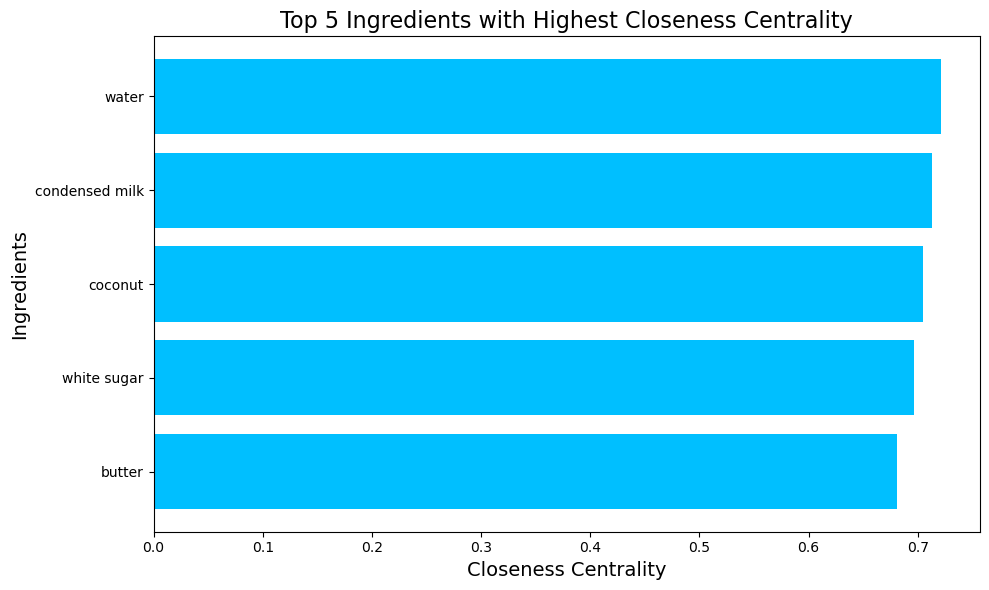

In [40]:
# Sort the DataFrame by 'Ingredient closeness Centrality' in descending order
ingredient_closeness_centrality_df_sorted = ingredient_centrality_df.sort_values(by='Ingredient Closeness Centrality', ascending=False)

# Select the top 5 ingredients with the highest closeness centrality
top_5_closeness_ingredients = ingredient_closeness_centrality_df_sorted.head(5)

# Reverse the order of the DataFrame to display the highest value at the top
top_5_closeness_ingredients = top_5_closeness_ingredients.iloc[::-1]

# Create a horizontal bar plot for the top 5 ingredients
plt.figure(figsize=(10, 6))
plt.barh(top_5_closeness_ingredients.index, top_5_closeness_ingredients['Ingredient Closeness Centrality'], color='deepskyblue')
plt.xlabel('Closeness Centrality', fontsize=14)
plt.ylabel('Ingredients', fontsize=14)
plt.title('Top 5 Ingredients with Highest Closeness Centrality', fontsize=16)
plt.tight_layout()
plt.show()

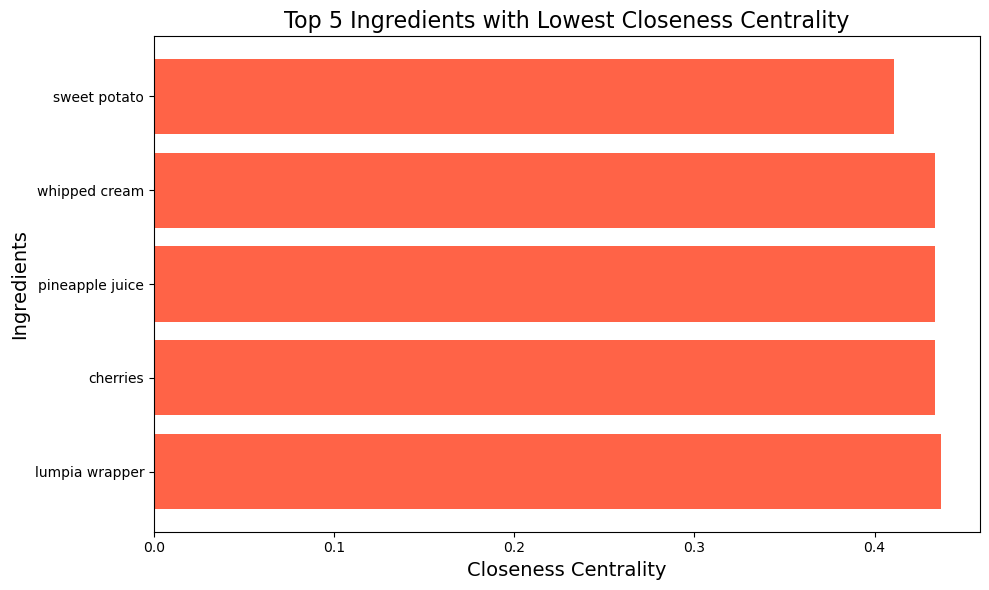

In [50]:
# Sort the DataFrame by 'IngredientClosenessCentrality' in descending order
ingredient_closeness_centrality_df_sorted = ingredient_centrality_df.sort_values(by='Ingredient Closeness Centrality', ascending=False)

# Select the top 5 ingredients with the highestClosenesscentrality
bottom_5_closeness_ingredients = ingredient_closeness_centrality_df_sorted.tail(5)

# Reverse the order of the DataFrame to display the highest value at the top
# bottom_5_closeness_ingredients = bottom_5_closeness_ingredients.iloc[::-1]

# Create a horizontal bar plot for the top 5 ingredients
plt.figure(figsize=(10, 6))
plt.barh(bottom_5_closeness_ingredients.index, bottom_5_closeness_ingredients['Ingredient Closeness Centrality'], color='tomato')
plt.xlabel('Closeness Centrality', fontsize=14)
plt.ylabel('Ingredients', fontsize=14)
plt.title('Top 5 Ingredients with Lowest Closeness Centrality', fontsize=16)
plt.tight_layout()
plt.show()

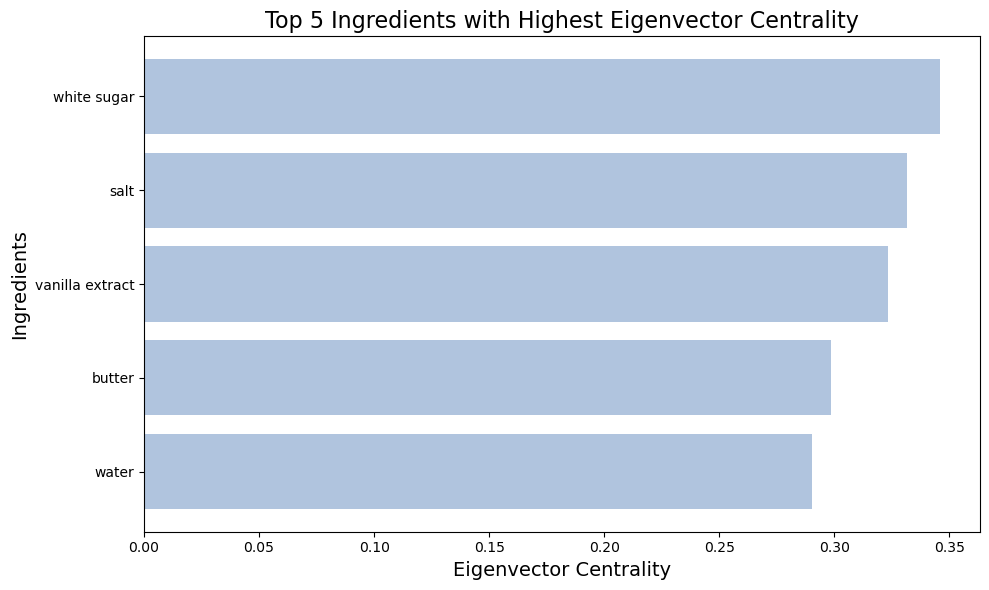

In [42]:
# Sort the DataFrame by 'Ingredient eigenvector Centrality' in descending order
ingredient_eigenvector_centrality_df_sorted = ingredient_centrality_df.sort_values(by='Ingredient Eigenvector Centrality', ascending=False)

# Select the top 5 ingredients with the highest eigenvector centrality
top_5_eigenvector_ingredients = ingredient_eigenvector_centrality_df_sorted.head(5)

# Reverse the order of the DataFrame to display the highest value at the top
top_5_eigenvector_ingredients = top_5_eigenvector_ingredients.iloc[::-1]

# Create a horizontal bar plot for the top 5 ingredients
plt.figure(figsize=(10, 6))
plt.barh(top_5_eigenvector_ingredients.index, top_5_eigenvector_ingredients['Ingredient Eigenvector Centrality'], color='lightsteelblue')
plt.xlabel('Eigenvector Centrality', fontsize=14)
plt.ylabel('Ingredients', fontsize=14)
plt.title('Top 5 Ingredients with Highest Eigenvector Centrality', fontsize=16)
plt.tight_layout()
plt.show()

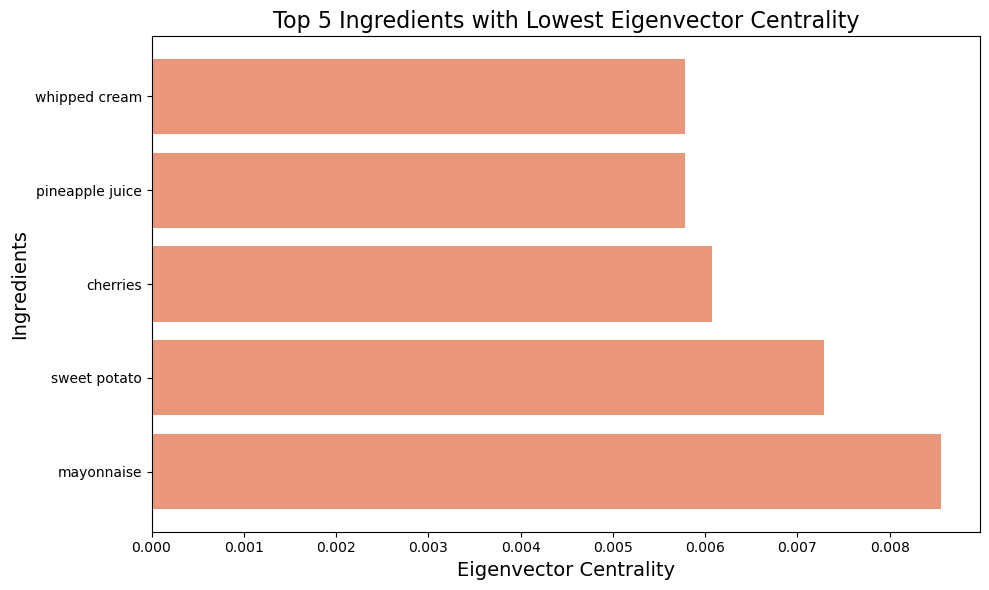

In [51]:
# Sort the DataFrame by 'IngredienteigenvectorCentrality' in descending order
ingredient_eigenvector_centrality_df_sorted = ingredient_centrality_df.sort_values(by='Ingredient Eigenvector Centrality', ascending=False)

# Select the top 5 ingredients with the highesteigenvectorcentrality
bottom_5_eigenvector_ingredients = ingredient_eigenvector_centrality_df_sorted.tail(5)

# Reverse the order of the DataFrame to display the highest value at the top
# bottom_5_eigenvector_ingredients = bottom_5_eigenvector_ingredients.iloc[::-1]

# Create a horizontal bar plot for the top 5 ingredients
plt.figure(figsize=(10, 6))
plt.barh(bottom_5_eigenvector_ingredients.index, bottom_5_eigenvector_ingredients['Ingredient Eigenvector Centrality'], color='darksalmon')
plt.xlabel('Eigenvector Centrality', fontsize=14)
plt.ylabel('Ingredients', fontsize=14)
plt.title('Top 5 Ingredients with Lowest Eigenvector Centrality', fontsize=16)
plt.tight_layout()
plt.show()

## Community Detection

### Desserts

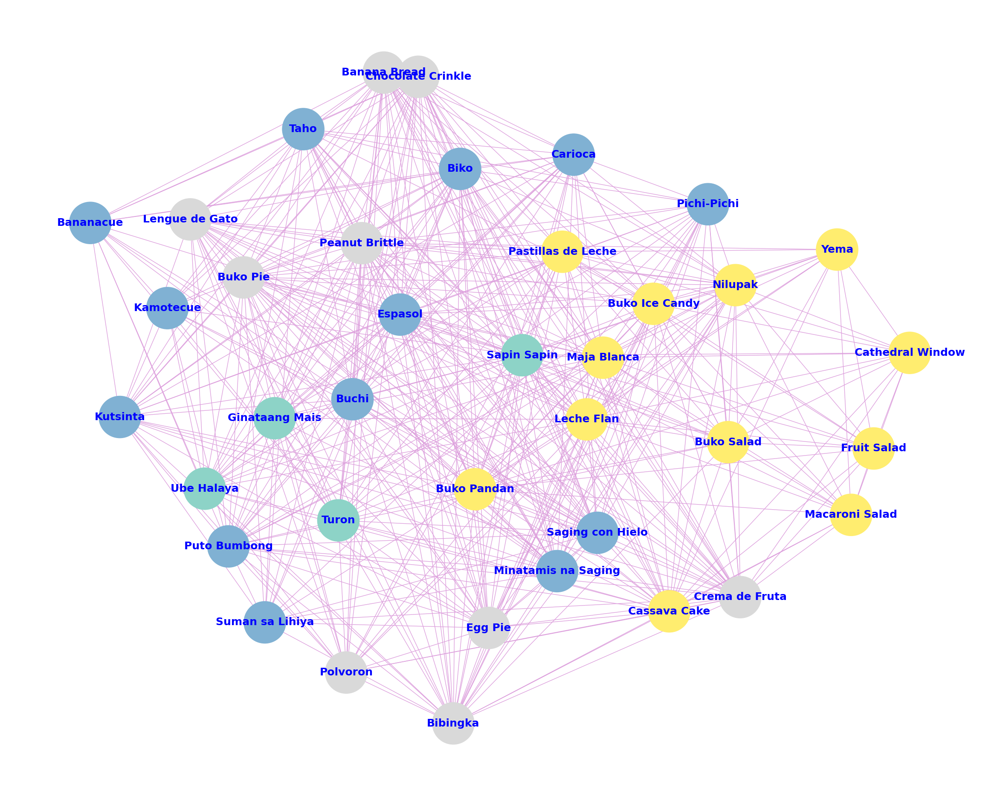

In [55]:
# Perform community detection using Louvain algorithm
dessert_communities = community_louvain.best_partition(dessert_projection, weight='weight', random_state=69)

# Create a figure and axes for dessert projection with communities
fig, ax = plt.subplots(figsize=(30, 24))
pos_dessert = nx.kamada_kawai_layout(dessert_projection, weight='weight')

# Assign node colors based on the community they belong to
node_colors = [dessert_communities[node] for node in dessert_projection.nodes()]
cmap = plt.colormaps['Set3']

nx.draw(dessert_projection, pos=pos_dessert, with_labels=True, node_color=node_colors, cmap=cmap, node_size=5000, font_weight='bold', font_color='blue', font_size=18, edge_color='plum', ax=ax)
# ax.set_title('Dessert Projection with Community Detection', fontsize=24)
plt.show()

### Ingredients

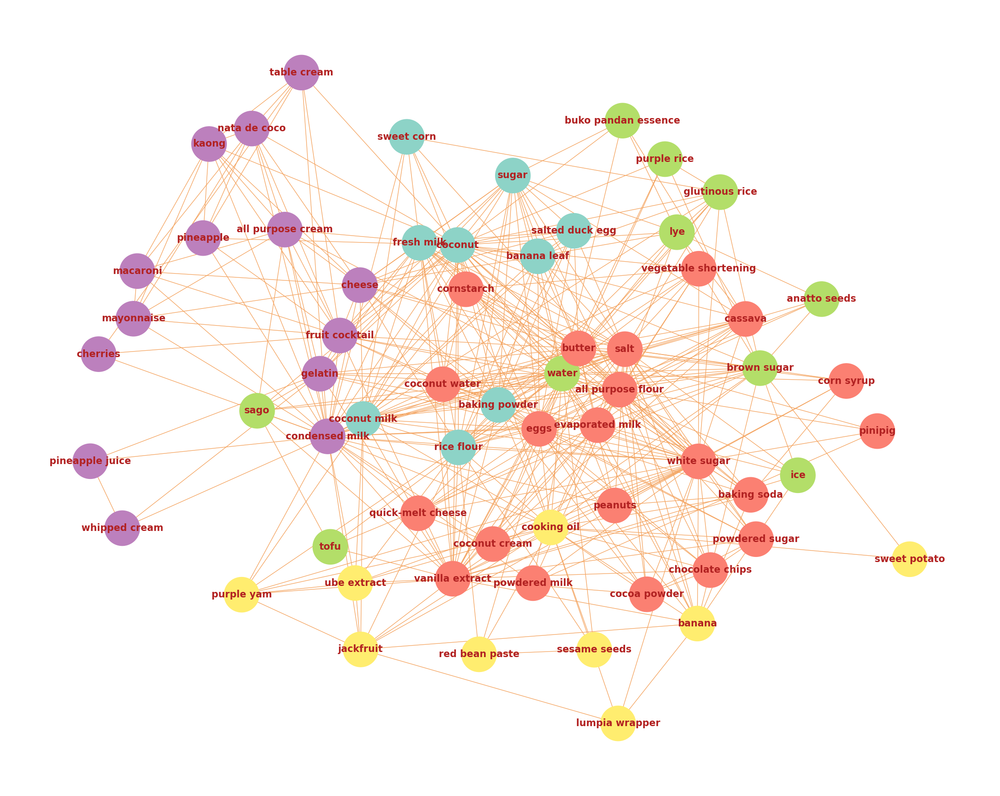

In [56]:
# Perform community detection using Louvain algorithm
ingredient_communities = community_louvain.best_partition(ingredient_projection, weight='weight', random_state=69)

# Create a figure and axes for ingredient projection with communities
fig, ax = plt.subplots(figsize=(30, 24))
pos_ingredient = nx.kamada_kawai_layout(ingredient_projection, weight='weight')

# Assign node colors based on the community they belong to
node_colors = [ingredient_communities[node] for node in ingredient_projection.nodes()]
cmap = plt.colormaps['Set3']

nx.draw(ingredient_projection, pos=pos_ingredient, with_labels=True, node_color=node_colors, cmap=cmap, node_size=3500, font_weight='bold', font_color='firebrick', font_size=16, edge_color='sandybrown', ax=ax)
# ax.set_title('Ingredient Projection with Community Detection', fontsize=24)
plt.show()

## Assortativity

### Desserts

In [28]:
# Calculate assortativity coefficient for the dessert projection
dessert_assortativity = nx.degree_assortativity_coefficient(dessert_projection, weight='weight')
print("Assortativity of Dessert Projection:", dessert_assortativity)

Assortativity of Dessert Projection: 0.015522707478629313


### Ingredients

In [29]:
# Calculate assortativity coefficient for the ingredient projection
ingredient_assortativity = nx.degree_assortativity_coefficient(ingredient_projection, weight='weight')
print("Assortativity of Ingredient Projection:", ingredient_assortativity)

Assortativity of Ingredient Projection: -0.1894487802006971


## Robustness Analysis

  0%|          | 0/100000 [00:00<?, ?it/s]

Average number of unavailable desserts after 100000 simulations: 3.60682


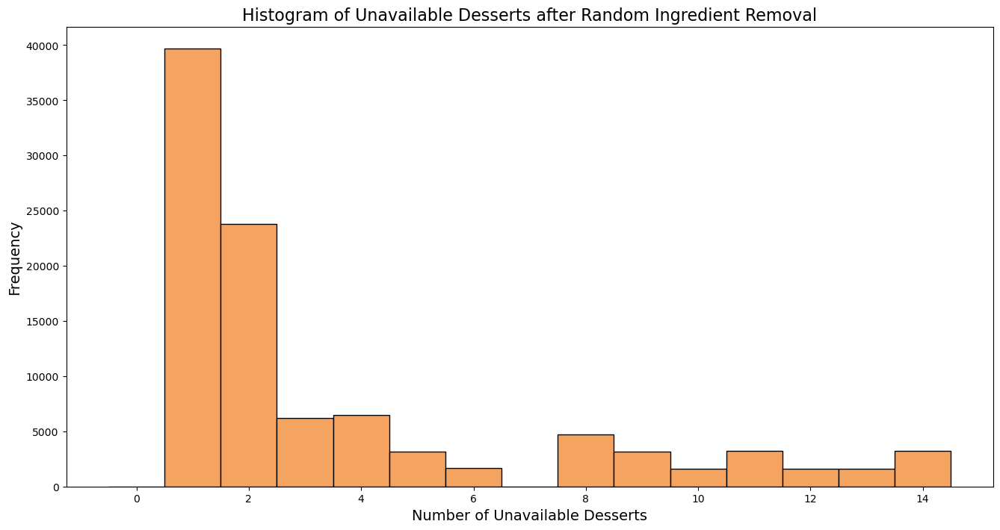

In [30]:
def count_unavailable_desserts(bipartite_graph, num_simulations, num_ingredients_to_remove):
    unavailable_desserts_counts = []
    unavailable_desserts_names = []

    for _ in trange(num_simulations):
        num_unavailable_desserts = 0
        names_unavailable_desserts = []
        G_orig = bipartite_graph.copy()

        # Randomly select a fraction of ingredient nodes to remove
        ingredient_nodes = [node for node in G_orig.nodes() if G_orig.nodes[node]['bipartite'] == 1]
        # num_ingredients_to_remove = int(fraction_of_ingredients_to_remove * len(ingredient_nodes))
        ingredients_to_remove = random.sample(ingredient_nodes, num_ingredients_to_remove)

        # Remove the selected ingredient nodes and their associated dessert nodes
        G = G_orig.copy()
        G.remove_nodes_from(ingredients_to_remove)

        # Check if any dessert nodes become unavailable (degree decreased to zero)
        for dessert_node in G.nodes():
            if G.nodes[dessert_node]['bipartite'] == 0:
                original_degree = G_orig.degree(dessert_node)
                new_degree = G.degree(dessert_node)
                if original_degree - new_degree > 0:
                    num_unavailable_desserts += 1
                    names_unavailable_desserts.append(dessert_node)
        
        unavailable_desserts_counts.append(num_unavailable_desserts)
        unavailable_desserts_names.append(names_unavailable_desserts)
        
    average_unavailable_desserts = np.mean(unavailable_desserts_counts)
    return average_unavailable_desserts, unavailable_desserts_counts, unavailable_desserts_names

# Example usage:
# Assuming you already have the bipartite graph 'B' created
num_simulations = 100_000
fraction_of_ingredients_to_remove = 0.1  # You can adjust this value as needed
num_ingredients_to_remove = 1

average_unavailable_desserts, unavailable_desserts, unavailable_desserts_names = count_unavailable_desserts(B, num_simulations, num_ingredients_to_remove)
print(f"Average number of unavailable desserts after {num_simulations} simulations: {average_unavailable_desserts}")

# Plot the histogram
plt.figure(figsize=(16, 8))
plt.hist(unavailable_desserts, bins=range(max(unavailable_desserts)+1), align='left', color='sandybrown', edgecolor='black')
plt.xlabel('Number of Unavailable Desserts', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Histogram of Unavailable Desserts after Random Ingredient Removal', fontsize=16)
plt.show()

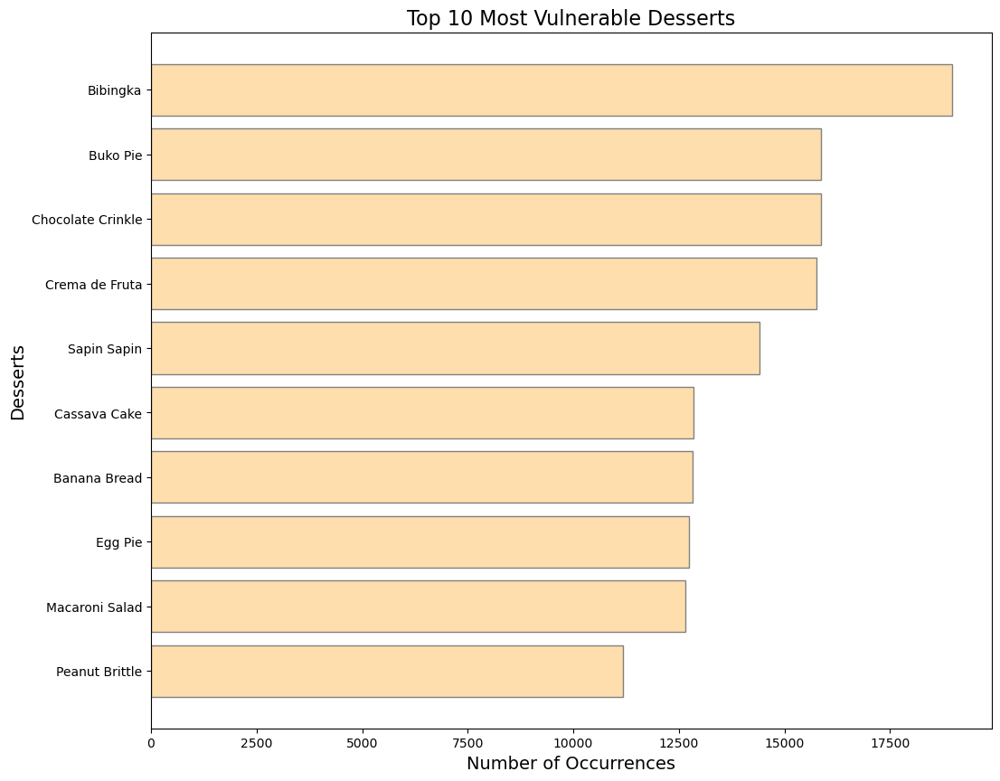

In [31]:
# Flatten the nested list
all_desserts = [dessert for sublist in unavailable_desserts_names for dessert in sublist]

# Count the appearance of each dessert
dessert_counts = Counter(all_desserts)

# Get the top 5 most vulnerable desserts
top_10_desserts = dict(dessert_counts.most_common(10))

# Plot the horizontal bar chart
plt.figure(figsize=(12, 10))
plt.barh(range(len(top_10_desserts)), list(top_10_desserts.values()), align='center', color='navajowhite', edgecolor='gray')
plt.yticks(range(len(top_10_desserts)), list(top_10_desserts.keys()))
plt.xlabel('Number of Occurrences', fontsize=14)
plt.ylabel('Desserts', fontsize=14)
plt.title('Top 10 Most Vulnerable Desserts', fontsize=16)
plt.gca().invert_yaxis()  # Invert the y-axis to display in descending order
plt.show()